In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from __future__ import print_function
import keras
from keras.preprocessing.image import ImageDataGenerator, load_img


/usr/local/lib/python3.5/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
train_dir ='./clean-dataset/train'
validation_dir ='./clean-dataset/validation'
image_size =224

In [3]:
from keras.applications import VGG16

vgg_conv =VGG16(weights='imagenet', include_top=False, input_shape=(image_size,
                                                                   image_size, 3))
# freeze all the layers
for layer in vgg_conv.layers[:]:
    layer.trainable =False
    
for layer in vgg_conv.layers:
    print(layer, layer.trainable)
    
from keras import models
from keras import layers
from keras import optimizers

model =models.Sequential()

model.add(vgg_conv)
model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(3, activation ='relu'))

model.summary()

<keras.engine.topology.InputLayer object at 0x7f6e986280b8> False
<keras.layers.convolutional.Conv2D object at 0x7f6e98628358> False
<keras.layers.convolutional.Conv2D object at 0x7f6e986282e8> False
<keras.layers.pooling.MaxPooling2D object at 0x7f6e98628518> False
<keras.layers.convolutional.Conv2D object at 0x7f6e985e3940> False
<keras.layers.convolutional.Conv2D object at 0x7f6e98576c50> False
<keras.layers.pooling.MaxPooling2D object at 0x7f6e985880f0> False
<keras.layers.convolutional.Conv2D object at 0x7f6e985aa668> False
<keras.layers.convolutional.Conv2D object at 0x7f6e985aaf60> False
<keras.layers.convolutional.Conv2D object at 0x7f6e9854e630> False
<keras.layers.pooling.MaxPooling2D object at 0x7f6e984f4278> False
<keras.layers.convolutional.Conv2D object at 0x7f6e98516048> False
<keras.layers.convolutional.Conv2D object at 0x7f6e98516f28> False
<keras.layers.convolutional.Conv2D object at 0x7f6e985294a8> False
<keras.layers.pooling.MaxPooling2D object at 0x7f6e984cce80> Fa

Found 600 images belonging to 3 classes.
Found 150 images belonging to 3 classes.
Epoch 1/20
12/12 [==============================] - 16s 1s/step - loss: 1.4055 - acc: 0.5117 - val_loss: 0.7786 - val_acc: 0.7667
Epoch 2/20
12/12 [==============================] - 11s 946ms/step - loss: 1.1468 - acc: 0.7633 - val_loss: 0.8063 - val_acc: 0.8333
Epoch 3/20
12/12 [==============================] - 11s 934ms/step - loss: 0.6159 - acc: 0.8467 - val_loss: 0.9433 - val_acc: 0.7733
Epoch 4/20
12/12 [==============================] - 12s 977ms/step - loss: 0.3984 - acc: 0.7383 - val_loss: 0.0040 - val_acc: 0.6067
Epoch 5/20
12/12 [==============================] - 11s 929ms/step - loss: 0.1102 - acc: 0.6150 - val_loss: 0.1075 - val_acc: 0.4467
Epoch 6/20
12/12 [==============================] - 11s 942ms/step - loss: 0.1343 - acc: 0.5700 - val_loss: 0.1075 - val_acc: 0.4467
Epoch 7/20
12/12 [==============================] - 11s 931ms/step - loss: 0.4450 - acc: 0.5983 - val_loss: 0.1075 - val_ac

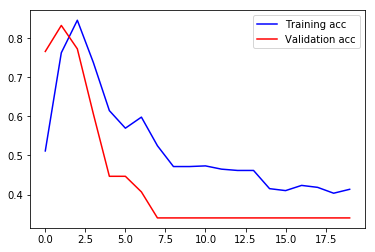

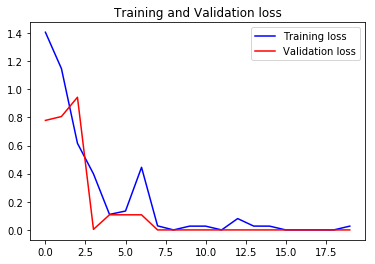

In [4]:
# data augmentation
train_datagen =ImageDataGenerator(rescale =1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)

train_batchsize =50
val_batchsize =10
#data Generator for training data
train_generator =train_datagen.flow_from_directory(train_dir, target_size=(image_size,
                                                                          image_size),
                                                  batch_size=train_batchsize,
                                                  class_mode ='categorical')
# data generator for validation data
validation_generator =validation_datagen.flow_from_directory(validation_dir,
                                                            target_size=(image_size,
                                                                        image_size),
                                                            batch_size=val_batchsize,
                                                            class_mode='categorical',
                                                            shuffle =False)

model.compile(loss='categorical_crossentropy', optimizer=optimizers.RMSprop(lr =1e-4),
             metrics=['acc'])

# Train the Model
history = model.fit_generator(
      train_generator,
      steps_per_epoch=train_generator.samples/train_generator.batch_size ,
      epochs=20,
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,
      verbose=1)

model.save('all_freezed.h5')

acc =history.history['acc']
val_acc =history.history['val_acc']
loss =history.history['loss']
val_loss =history.history['val_loss']

epochs =range(len(acc))
plt.plot(epochs, acc, 'b',label='Training acc')
plt.plot(epochs, val_acc, 'r', label ='Validation acc')
plt.legend()
plt.figure()

plt.plot(epochs, loss, 'b', label ='Training loss')
plt.plot(epochs, val_loss, 'r', label ='Validation loss')
plt.title('Training and Validation loss')
plt.legend()
plt.show()


Found 150 images belonging to 3 classes.
15/15 [==============================] - 3s 168ms/step
No of errors = 99/150


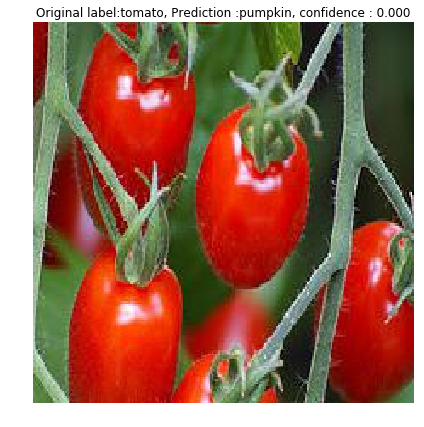

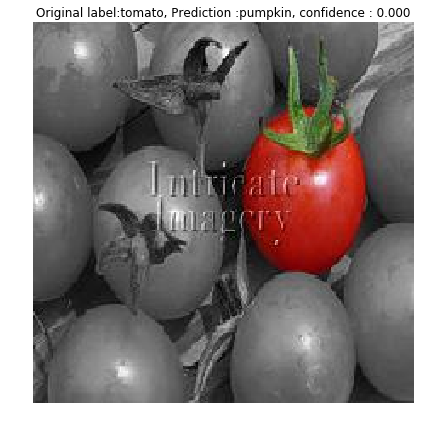

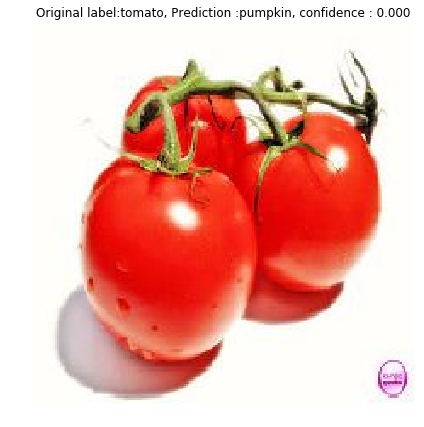

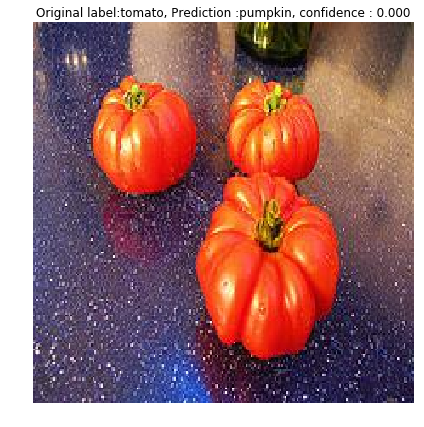

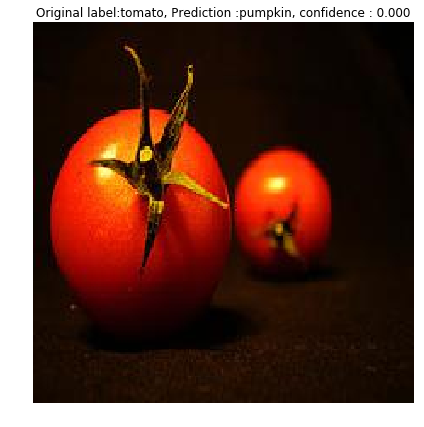

...

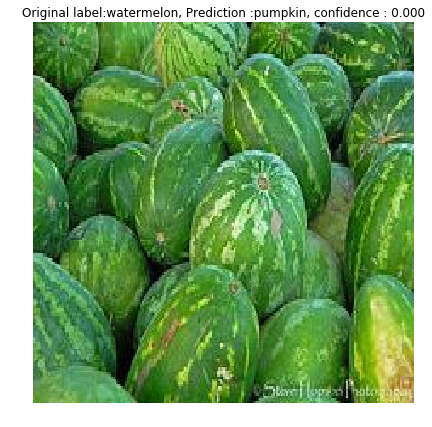

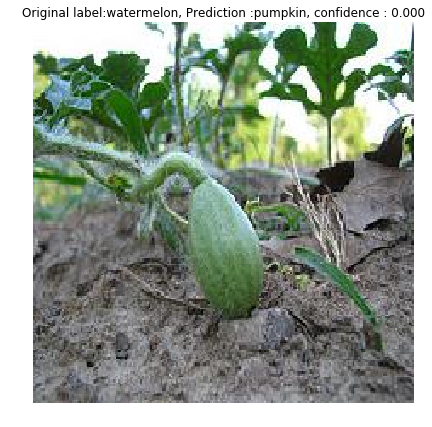

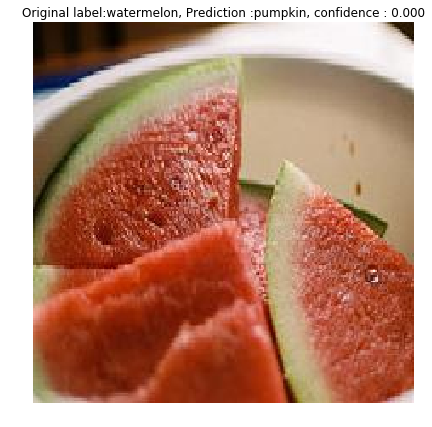

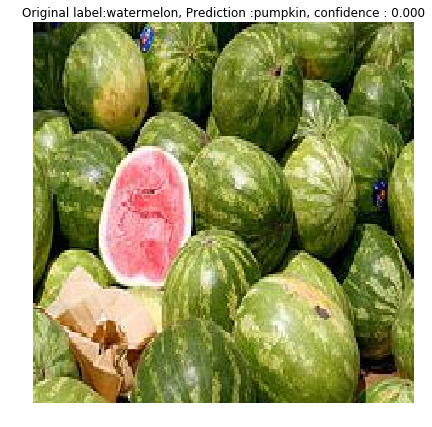

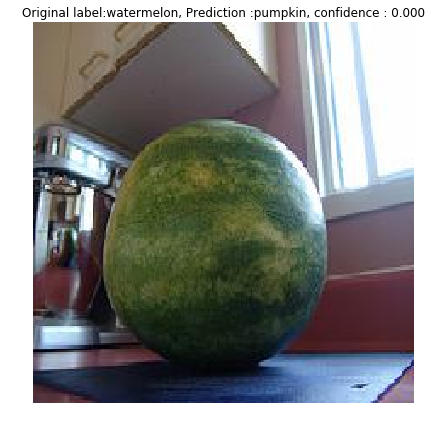

In [7]:
# Create a generator for prediction
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Get the filenames from the generator
fnames = validation_generator.filenames

# Get the ground truth from generator
ground_truth = validation_generator.classes

# Get the label to class mapping from the generator
label2index = validation_generator.class_indices

# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())

# Get the predictions from the model using the generator
predictions = model.predict_generator(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)
predicted_classes = np.argmax(predictions,axis=1)

errors = np.where(predicted_classes != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),validation_generator.samples))

# Show the errors
for i in range(len(errors)):
    pred_class = np.argmax(predictions[errors[i]])
    pred_label = idx2label[pred_class]
    
    title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label,
        predictions[errors[i]][pred_class])
    
    original = load_img('{}/{}'.format(validation_dir,fnames[errors[i]]))
    plt.figure(figsize=[7,7])
    plt.axis('off')
    plt.title(title)
    plt.imshow(original)
    plt.show()

In [3]:
from keras.applications import VGG16

#Load the VGG model
vgg_conv = VGG16(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))

# Freeze all the layers
for layer in vgg_conv.layers[:-4]:
    layer.trainable = False

# Check the trainable status of the individual layers
for layer in vgg_conv.layers:
    print(layer, layer.trainable)


from keras import models
from keras import layers
from keras import optimizers

# Create the model
model = models.Sequential()

# Add the vgg convolutional base model
model.add(vgg_conv)

# Add new layers
model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(3, activation='softmax'))

# Show a summary of the model. Check the number of trainable parameters
model.summary()

<keras.engine.topology.InputLayer object at 0x7fbeaf9a4208> False
<keras.layers.convolutional.Conv2D object at 0x7fbeaf9a4358> False
<keras.layers.convolutional.Conv2D object at 0x7fbeaf9a4470> False
<keras.layers.pooling.MaxPooling2D object at 0x7fbeaf9a45c0> False
<keras.layers.convolutional.Conv2D object at 0x7fbeaf962a20> False
<keras.layers.convolutional.Conv2D object at 0x7fbeaf8f6d68> False
<keras.layers.pooling.MaxPooling2D object at 0x7fbeaf9071d0> False
<keras.layers.convolutional.Conv2D object at 0x7fbeaf929780> False
<keras.layers.convolutional.Conv2D object at 0x7fbeaf9297b8> False
<keras.layers.convolutional.Conv2D object at 0x7fbeaf8cdbe0> False
<keras.layers.pooling.MaxPooling2D object at 0x7fbeaf8732e8> False
<keras.layers.convolutional.Conv2D object at 0x7fbeaf8970b8> False
<keras.layers.convolutional.Conv2D object at 0x7fbeaf897f60> False
<keras.layers.convolutional.Conv2D object at 0x7fbeaf8a9588> False
<keras.layers.pooling.MaxPooling2D object at 0x7fbeaf84c208> Fa

In [4]:
# No Data augmentation 
train_datagen = ImageDataGenerator(rescale=1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)

# Change the batchsize according to your system RAM
train_batchsize = 50
val_batchsize = 10

# Data Generator for Training data
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(image_size, image_size),
        batch_size=train_batchsize,
        class_mode='categorical')

# Data Generator for Validation data
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

# Train the Model
history = model.fit_generator(
      train_generator,
      steps_per_epoch=train_generator.samples/train_generator.batch_size ,
      epochs=20,
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,
      verbose=1)

# Save the Model
model.save('last4_layers.h5')

# Plot the accuracy and loss curves
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

Found 600 images belonging to 3 classes.
Found 150 images belonging to 3 classes.
Epoch 1/20
12/12 [==============================] - 17s 1s/step - loss: 1.6593 - acc: 0.4833 - val_loss: 0.6575 - val_acc: 0.7333
Epoch 2/20
12/12 [==============================] - 13s 1s/step - loss: 0.5242 - acc: 0.7750 - val_loss: 0.3649 - val_acc: 0.8867
Epoch 3/20
12/12 [==============================] - 12s 1s/step - loss: 0.1810 - acc: 0.9467 - val_loss: 0.3465 - val_acc: 0.8400
Epoch 4/20
12/12 [==============================] - 12s 1s/step - loss: 0.2095 - acc: 0.9350 - val_loss: 0.2332 - val_acc: 0.9267
Epoch 5/20
12/12 [==============================] - 12s 1s/step - loss: 0.0195 - acc: 0.9950 - val_loss: 0.2085 - val_acc: 0.9333
Epoch 6/20
12/12 [==============================] - 12s 1s/step - loss: 0.0039 - acc: 1.0000 - val_loss: 0.2509 - val_acc: 0.9533
Epoch 7/20
12/12 [==============================] - 12s 1s/step - loss: 1.1503 - acc: 0.9017 - val_loss: 1.5976 - val_acc: 0.5533
Epoch 8/

ResourceExhaustedError: OOM when allocating tensor with shape[50,64,224,224]
	 [[Node: vgg16/block1_conv2/convolution = Conv2D[T=DT_FLOAT, data_format="NHWC", padding="SAME", strides=[1, 1, 1, 1], use_cudnn_on_gpu=true, _device="/job:localhost/replica:0/task:0/device:GPU:0"](vgg16/block1_conv1/Relu, block1_conv2/kernel/read)]]
	 [[Node: metrics/acc/Mean/_245 = _Recv[client_terminated=false, recv_device="/job:localhost/replica:0/task:0/device:CPU:0", send_device="/job:localhost/replica:0/task:0/device:GPU:0", send_device_incarnation=1, tensor_name="edge_791_metrics/acc/Mean", tensor_type=DT_FLOAT, _device="/job:localhost/replica:0/task:0/device:CPU:0"]()]]

Caused by op 'vgg16/block1_conv2/convolution', defined at:
  File "/usr/lib/python3.5/runpy.py", line 184, in _run_module_as_main
    "__main__", mod_spec)
  File "/usr/lib/python3.5/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/usr/local/lib/python3.5/dist-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/usr/local/lib/python3.5/dist-packages/ipykernel/kernelapp.py", line 486, in start
    self.io_loop.start()
  File "/usr/local/lib/python3.5/dist-packages/tornado/platform/asyncio.py", line 112, in start
    self.asyncio_loop.run_forever()
  File "/usr/lib/python3.5/asyncio/base_events.py", line 345, in run_forever
    self._run_once()
  File "/usr/lib/python3.5/asyncio/base_events.py", line 1312, in _run_once
    handle._run()
  File "/usr/lib/python3.5/asyncio/events.py", line 125, in _run
    self._callback(*self._args)
  File "/usr/local/lib/python3.5/dist-packages/tornado/platform/asyncio.py", line 102, in _handle_events
    handler_func(fileobj, events)
  File "/usr/local/lib/python3.5/dist-packages/tornado/stack_context.py", line 276, in null_wrapper
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.5/dist-packages/zmq/eventloop/zmqstream.py", line 450, in _handle_events
    self._handle_recv()
  File "/usr/local/lib/python3.5/dist-packages/zmq/eventloop/zmqstream.py", line 480, in _handle_recv
    self._run_callback(callback, msg)
  File "/usr/local/lib/python3.5/dist-packages/zmq/eventloop/zmqstream.py", line 432, in _run_callback
    callback(*args, **kwargs)
  File "/usr/local/lib/python3.5/dist-packages/tornado/stack_context.py", line 276, in null_wrapper
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.5/dist-packages/ipykernel/kernelbase.py", line 283, in dispatcher
    return self.dispatch_shell(stream, msg)
  File "/usr/local/lib/python3.5/dist-packages/ipykernel/kernelbase.py", line 233, in dispatch_shell
    handler(stream, idents, msg)
  File "/usr/local/lib/python3.5/dist-packages/ipykernel/kernelbase.py", line 399, in execute_request
    user_expressions, allow_stdin)
  File "/usr/local/lib/python3.5/dist-packages/ipykernel/ipkernel.py", line 208, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "/usr/local/lib/python3.5/dist-packages/ipykernel/zmqshell.py", line 537, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "/usr/local/lib/python3.5/dist-packages/IPython/core/interactiveshell.py", line 2728, in run_cell
    interactivity=interactivity, compiler=compiler, result=result)
  File "/usr/local/lib/python3.5/dist-packages/IPython/core/interactiveshell.py", line 2850, in run_ast_nodes
    if self.run_code(code, result):
  File "/usr/local/lib/python3.5/dist-packages/IPython/core/interactiveshell.py", line 2910, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-3-562cbb509605>", line 23, in <module>
    model.add(vgg_conv)
  File "/home/jijeng/.local/lib/python3.5/site-packages/keras/models.py", line 467, in add
    layer(x)
  File "/home/jijeng/.local/lib/python3.5/site-packages/keras/engine/topology.py", line 619, in __call__
    output = self.call(inputs, **kwargs)
  File "/home/jijeng/.local/lib/python3.5/site-packages/keras/engine/topology.py", line 2085, in call
    output_tensors, _, _ = self.run_internal_graph(inputs, masks)
  File "/home/jijeng/.local/lib/python3.5/site-packages/keras/engine/topology.py", line 2236, in run_internal_graph
    output_tensors = _to_list(layer.call(computed_tensor, **kwargs))
  File "/home/jijeng/.local/lib/python3.5/site-packages/keras/layers/convolutional.py", line 168, in call
    dilation_rate=self.dilation_rate)
  File "/home/jijeng/.local/lib/python3.5/site-packages/keras/backend/tensorflow_backend.py", line 3335, in conv2d
    data_format=tf_data_format)
  File "/home/jijeng/.local/lib/python3.5/site-packages/tensorflow/python/ops/nn_ops.py", line 751, in convolution
    return op(input, filter)
  File "/home/jijeng/.local/lib/python3.5/site-packages/tensorflow/python/ops/nn_ops.py", line 835, in __call__
    return self.conv_op(inp, filter)
  File "/home/jijeng/.local/lib/python3.5/site-packages/tensorflow/python/ops/nn_ops.py", line 499, in __call__
    return self.call(inp, filter)
  File "/home/jijeng/.local/lib/python3.5/site-packages/tensorflow/python/ops/nn_ops.py", line 187, in __call__
    name=self.name)
  File "/home/jijeng/.local/lib/python3.5/site-packages/tensorflow/python/ops/gen_nn_ops.py", line 631, in conv2d
    data_format=data_format, name=name)
  File "/home/jijeng/.local/lib/python3.5/site-packages/tensorflow/python/framework/op_def_library.py", line 787, in _apply_op_helper
    op_def=op_def)
  File "/home/jijeng/.local/lib/python3.5/site-packages/tensorflow/python/framework/ops.py", line 2956, in create_op
    op_def=op_def)
  File "/home/jijeng/.local/lib/python3.5/site-packages/tensorflow/python/framework/ops.py", line 1470, in __init__
    self._traceback = self._graph._extract_stack()  # pylint: disable=protected-access

ResourceExhaustedError (see above for traceback): OOM when allocating tensor with shape[50,64,224,224]
	 [[Node: vgg16/block1_conv2/convolution = Conv2D[T=DT_FLOAT, data_format="NHWC", padding="SAME", strides=[1, 1, 1, 1], use_cudnn_on_gpu=true, _device="/job:localhost/replica:0/task:0/device:GPU:0"](vgg16/block1_conv1/Relu, block1_conv2/kernel/read)]]
	 [[Node: metrics/acc/Mean/_245 = _Recv[client_terminated=false, recv_device="/job:localhost/replica:0/task:0/device:CPU:0", send_device="/job:localhost/replica:0/task:0/device:GPU:0", send_device_incarnation=1, tensor_name="edge_791_metrics/acc/Mean", tensor_type=DT_FLOAT, _device="/job:localhost/replica:0/task:0/device:CPU:0"]()]]


Found 150 images belonging to 3 classes.
15/15 [==============================] - 2s 164ms/step
No of errors = 11/150


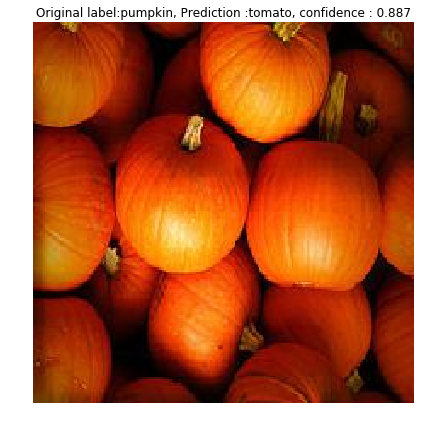

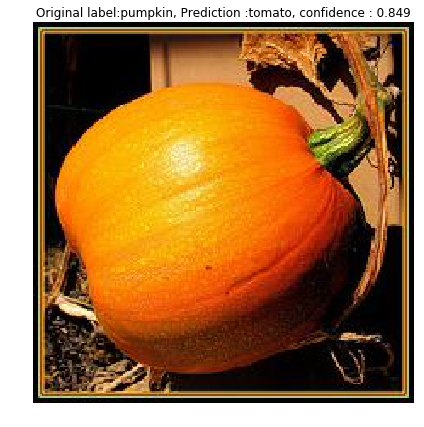

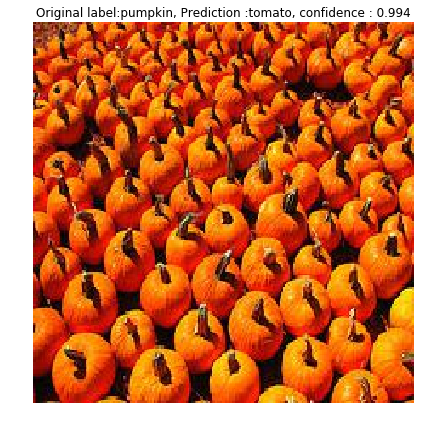

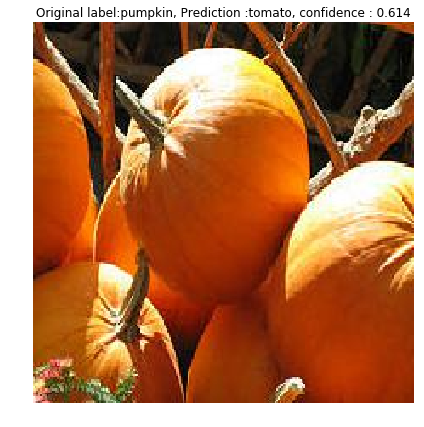

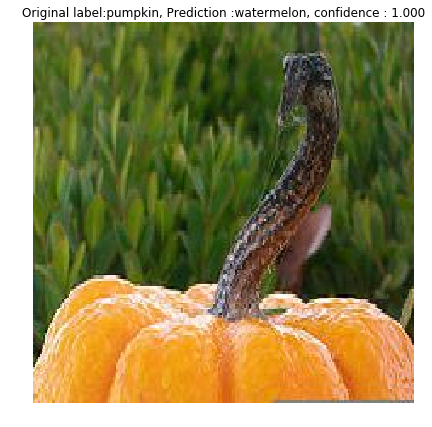

...

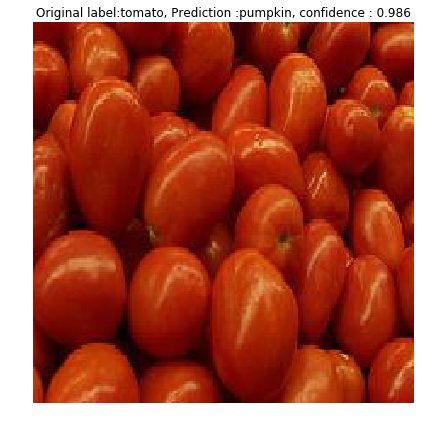

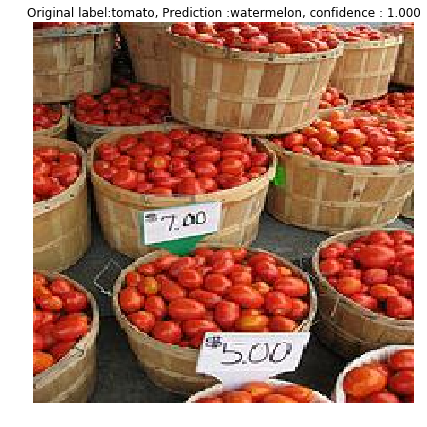

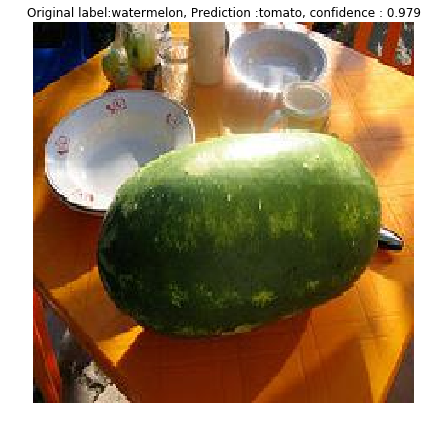

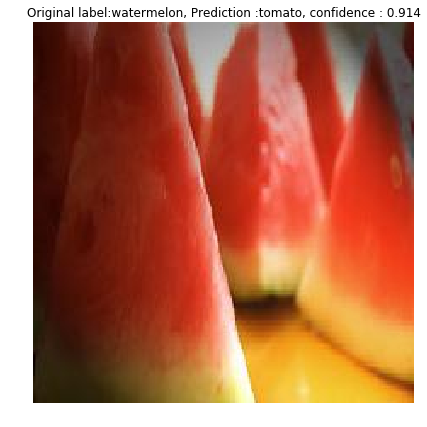

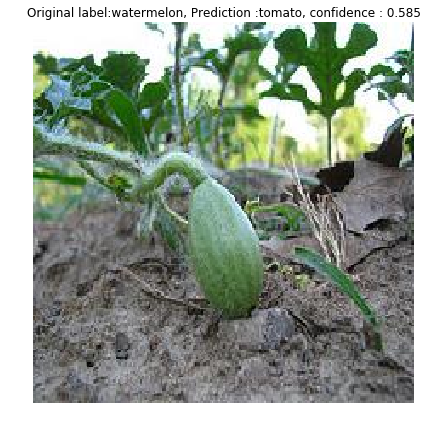

In [5]:
# Create a generator for prediction
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Get the filenames from the generator
fnames = validation_generator.filenames

# Get the ground truth from generator
ground_truth = validation_generator.classes

# Get the label to class mapping from the generator
label2index = validation_generator.class_indices

# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())

# Get the predictions from the model using the generator
predictions = model.predict_generator(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)
predicted_classes = np.argmax(predictions,axis=1)

errors = np.where(predicted_classes != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),validation_generator.samples))

# Show the errors
for i in range(len(errors)):
    pred_class = np.argmax(predictions[errors[i]])
    pred_label = idx2label[pred_class]
    
    title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label,
        predictions[errors[i]][pred_class])
    
    original = load_img('{}/{}'.format(validation_dir,fnames[errors[i]]))
    plt.figure(figsize=[7,7])
    plt.axis('off')
    plt.title(title)
    plt.imshow(original)
    plt.show()

In [3]:
from keras.applications import VGG16

#Load the VGG model
vgg_conv = VGG16(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))

# Freeze all the layers
for layer in vgg_conv.layers[:-4]:
    layer.trainable = False

# Check the trainable status of the individual layers
for layer in vgg_conv.layers:
    print(layer, layer.trainable)


from keras import models
from keras import layers
from keras import optimizers

# Create the model
model = models.Sequential()

# Add the vgg convolutional base model
model.add(vgg_conv)

# Add new layers
model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(3, activation='softmax'))

# Show a summary of the model. Check the number of trainable parameters
model.summary()

<keras.engine.topology.InputLayer object at 0x7f2f797a8fd0> False
<keras.layers.convolutional.Conv2D object at 0x7f2f797a72b0> False
<keras.layers.convolutional.Conv2D object at 0x7f2f797a7240> False
<keras.layers.pooling.MaxPooling2D object at 0x7f2f797a7390> False
<keras.layers.convolutional.Conv2D object at 0x7f2f79766898> False
<keras.layers.convolutional.Conv2D object at 0x7f2f796f8be0> False
<keras.layers.pooling.MaxPooling2D object at 0x7f2f7970b0f0> False
<keras.layers.convolutional.Conv2D object at 0x7f2f7972eeb8> False
<keras.layers.convolutional.Conv2D object at 0x7f2f7972e4e0> False
<keras.layers.convolutional.Conv2D object at 0x7f2f796d1710> False
<keras.layers.pooling.MaxPooling2D object at 0x7f2f79676668> False
<keras.layers.convolutional.Conv2D object at 0x7f2f7969c668> False
<keras.layers.convolutional.Conv2D object at 0x7f2f7969c898> False
<keras.layers.convolutional.Conv2D object at 0x7f2f796ad048> False
<keras.layers.pooling.MaxPooling2D object at 0x7f2f796509b0> Fa

Found 600 images belonging to 3 classes.
Found 150 images belonging to 3 classes.
Epoch 1/40
80/80 [==============================] - 29s 363ms/step - loss: 0.7159 - acc: 0.6917 - val_loss: 0.1630 - val_acc: 0.9333
Epoch 2/40
80/80 [==============================] - 25s 318ms/step - loss: 0.1914 - acc: 0.9342 - val_loss: 0.1525 - val_acc: 0.9733
Epoch 3/40
80/80 [==============================] - 25s 318ms/step - loss: 0.1185 - acc: 0.9617 - val_loss: 0.2195 - val_acc: 0.9400
Epoch 4/40
80/80 [==============================] - 25s 318ms/step - loss: 0.0869 - acc: 0.9758 - val_loss: 0.7621 - val_acc: 0.8733
Epoch 5/40
80/80 [==============================] - 25s 318ms/step - loss: 0.0691 - acc: 0.9775 - val_loss: 1.1097 - val_acc: 0.8733
Epoch 6/40
80/80 [==============================] - 25s 319ms/step - loss: 0.1310 - acc: 0.9725 - val_loss: 0.2662 - val_acc: 0.9733
Epoch 7/40
80/80 [==============================] - 26s 319ms/step - loss: 0.0636 - acc: 0.9800 - val_loss: 0.2731 - val

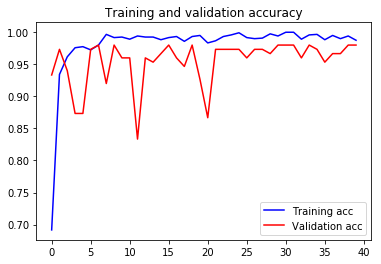

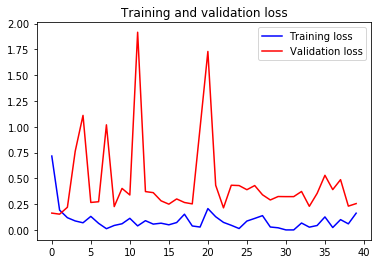

In [4]:
train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=20,
      width_shift_range=0.2,
      height_shift_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

validation_datagen = ImageDataGenerator(rescale=1./255)

# Change the batchsize according to your system RAM
train_batchsize = 15
val_batchsize = 10

# Data Generator for Training data
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(image_size, image_size),
        batch_size=train_batchsize,
        class_mode='categorical')

# Data Generator for Validation data
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

# Train the Model
# NOTE that we have multiplied the steps_per_epoch by 2. This is because we are using data augmentation.
history = model.fit_generator(
      train_generator,
      steps_per_epoch=2*train_generator.samples/train_generator.batch_size ,
      epochs=40,
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,
      verbose=1)

# Save the Model
model.save('da_last4_layers.h5')

# Plot the accuracy and loss curves
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

Found 150 images belonging to 3 classes.
15/15 [==============================] - 2s 164ms/step
No of errors = 3/150


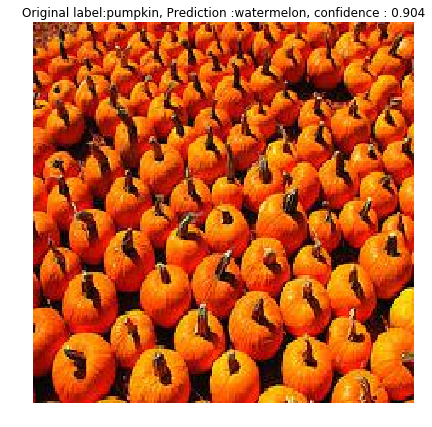

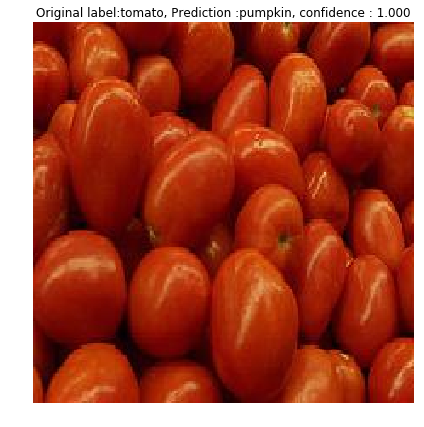

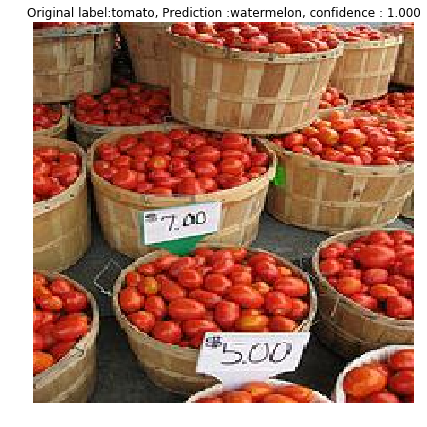

In [5]:
# Create a generator for prediction
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Get the filenames from the generator
fnames = validation_generator.filenames

# Get the ground truth from generator
ground_truth = validation_generator.classes

# Get the label to class mapping from the generator
label2index = validation_generator.class_indices

# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())

# Get the predictions from the model using the generator
predictions = model.predict_generator(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)
predicted_classes = np.argmax(predictions,axis=1)

errors = np.where(predicted_classes != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),validation_generator.samples))

# Show the errors
for i in range(len(errors)):
    pred_class = np.argmax(predictions[errors[i]])
    pred_label = idx2label[pred_class]
    
    title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label,
        predictions[errors[i]][pred_class])
    
    original = load_img('{}/{}'.format(validation_dir,fnames[errors[i]]))
    plt.figure(figsize=[7,7])
    plt.axis('off')
    plt.title(title)
    plt.imshow(original)
    plt.show()